In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
from Bio import Phylo
from scipy.stats import pearsonr

import matplotlib.pyplot as plt
from matplotlib import font_manager
import matplotlib.patheffects as pe
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
plt.rcParams['font.sans-serif'] = ['Arial']
plt.rcParams['font.size'] = 16  
import pygot
import scvelo as scv
import phylovelo as pv
from sklearn.preprocessing import minmax_scale
from scipy.stats import spearmanr

## Helper function

In [2]:
# BUG in phylovelo pseudotime, use calc_phylo_pseudotime
import numpy as np
from sklearn.neighbors import NearestNeighbors
from scipy.sparse.csgraph import minimum_spanning_tree
from tqdm.autonotebook import tqdm

import heapq

def get_nearest_neighbor(data:'numpy.ndarray', target:int, n_neighbors:int=10):
    '''
    Get nearest neighbors of the target
    
    Args:
        data:
            Data to train knn
        target:
            Target point to get nearest neighbors
        n_neighbors:
            How many nearest neighbors to return
    
    Returns:
        list:
            Euclidean distance from target to neighbors
        list:
            Neighbors' indices
    
    '''
    neigh = NearestNeighbors(n_neighbors=n_neighbors)
    neigh.fit(data)
    neighbor = neigh.kneighbors([data[target]])
    distance, loc = neighbor[0], neighbor[1]
    return distance[0], loc[0]


def time_interval(pt1:'numpy.ndarray', pt2:'numpy.ndarray', v1:'numpy.ndarray', v2:'numpy.ndarray'):
    '''
    Given two points' coordinate and velocity, calculate the time interval
    
    Args:
        pt1: 
            Coordinate of one point
        pt2: 
            Coordinate of the other point
        v1: 
            Velocity of one point
        v2: 
            Velocity of the other point
    
    Return:
        float:
            Time interval
    '''
    va = (v1 + v2) / 2
    a1 = pt2 - pt1
    with np.errstate(all="ignore"):
        cos = (a1 * va).sum() / np.sqrt((a1**2).sum()) / np.sqrt((va**2).sum())
    v_proj = np.sqrt((va**2).sum()) * cos
    pt = np.sqrt((a1**2).sum()) / (v_proj + 1e-9)
    if np.isnan(pt):
        return 1e99
    return pt


def graph_dict(pts:'numpy.ndarry', v:'numpy.ndarry', n_neighbors:int=30):
    '''
    Build graph to construct MST
    
    Args:
        pts: 
            All cells' coordinate in embedding
        v:
            Phylo velocity
        n_neighbors:
            N nearest neighbors to build MST
    
    Return:
        dict:
            Graph to build MSt
    '''
    graph_dict = {}
    for i in range(pts.shape[0]):
        graph_dict[i] = {}
        dis, nbrs = get_nearest_neighbor(pts, i, n_neighbors)
        for d, nbr in zip(dis, nbrs):
            graph_dict[i][nbr] = abs(time_interval(pts[i], pts[nbr], v[i], v[nbr]))
    return graph_dict


def prim(graph, root):

    # 初始化最小生成树
    mst_edges = []
    
    # 使用优先队列来管理边的权重
    min_heap = []
    visited = set()
    
    # 将根节点的所有边加入到优先队列
    def add_edges(node):
        visited.add(node)
        for neighbor, weight in graph[node].items():
            if neighbor not in visited:
                heapq.heappush(min_heap, (weight, node, neighbor))  # (边的权重, 当前节点, 相邻节点)
    
    # 从根节点开始
    add_edges(root)
    
    while min_heap:
        weight, node, neighbor = heapq.heappop(min_heap)
        
        if neighbor not in visited:
            # 将新的边加入到MST中
            mst_edges.append((node, neighbor))
            
            # 将新节点的所有边加入到优先队列中
            add_edges(neighbor)
    
    return mst_edges

def calc_phylo_pseudotime(sd:'scData', n_neighbors:int=30, r_sample:float=1):
    '''
    Calculate the phyloVelo pseudotime
    
    Args:
        sd:
            sc data
        n_neighbors:
            N nearest neighbors to build MST. The smaller the number, the faster the calculation, but there is a chance of error
        r_sample:
            [0-1], random sample a subset calculate pseudotime.
            
    Return:
        scData.phylo_pseudotime
    '''
    if r_sample < 1:
        n_cells = len(sd.Xdr.index)
        n_sample = int(n_cells * r_sample)
        sample_names = np.random.choice(sd.Xdr.index, n_sample, replace=False)
        pts = sd.Xdr.loc[sample_names].to_numpy()
        v = sd.velocity_embeded[np.isin(sd.Xdr.index, sample_names), :]
    else:
        sample_names = sd.Xdr.index
        pts = sd.Xdr.to_numpy()
        v = sd.velocity_embeded

    with np.errstate(all="ignore"):
        graph = graph_dict(pts, v, n_neighbors=n_neighbors)
    
    # Compute MST using Prim's algorithm
    path = prim(graph, 0)
    
    # Calculate pseudotime using MST
    pseudo_time = {sample_names[0]: 1}
    
    for p in path:
        pseudo_time[sample_names[p[1]]] = min(
            pseudo_time.get(sample_names[p[0]], 1e99) + time_interval(pts[p[0]], pts[p[1]], v[p[0]], v[p[1]]),
            pseudo_time.get(sample_names[p[1]], 1e99),
        )
    
    if len(path) < sd.Xdr.shape[0]:
        # If MST does not span all cells, interpolate pseudotime
        pseudo_time_full = dict()
        neigh = NearestNeighbors(n_neighbors=5)
        neigh.fit(pts)

        for ind, name in enumerate(sd.Xdr.index):
            if name in pseudo_time:
                pseudo_time_full[name] = pseudo_time[name]
            else:
                # Find nearest neighbors and interpolate
                neighbor = neigh.kneighbors([sd.Xdr.loc[name].to_numpy()])
                neighbors = neighbor[1][0]
                pseudo_time_full[name] = np.nanmean(
                    [pseudo_time[sample_names[i]] if sample_names[i] in pseudo_time else np.nan for i in neighbors]
                )
        
        # Update final pseudotime values
        for ind, name in enumerate(sd.Xdr.index):
            pseudo_time[ind] = pseudo_time_full[name]

    # Normalize pseudotime
    time = np.array([-pseudo_time[i] for i in range(sd.Xdr.shape[0])])
    time = time - min(time)
    time = time / max(time)
    sd.phylo_pseudotime = time
    
    return sd


In [3]:

def plot_velocity_embedding_from_latent_velocity(adata, embedding_key, velocity_key, **kwargs):
    tmp_adata = sc.AnnData(X=adata.obsm[embedding_key], obs=adata.obs)
    tmp_adata.layers['velocity'] = adata.obsm[velocity_key]
    tmp_adata.obsp = adata.obsp
    tmp_adata.uns = adata.uns
    tmp_adata.obsm = adata.obsm
    
    scv.pl.velocity_embedding_stream(tmp_adata, **kwargs)
    adata.obsm['velocity_umap'] = tmp_adata.obsm['velocity_umap']

In [4]:
# The data is downloaded from https://zenodo.org/records/5847462#.YhBD0pPMLYU
def phylovelo_process(adata, tumor):
    tree = Phylo.read('../pygot_data/cancer/KPTracer-Data/trees/{}_tree.nwk'.format(tumor), format='newick')
    xdr = pd.DataFrame(data=adata.obsm['X_umap'], index=adata.obs.index)
    sel_cells = np.array([i.name for i in tree.get_terminals()])
    sel_cells = sel_cells[np.isin(sel_cells, xdr.index)]
    sel_xdr = xdr.loc[sel_cells]
    #cond = sel_xdr.iloc[:,0]<2
    #cond = cond & ~((sel_xdr.iloc[:,1]<3)&(sel_xdr.iloc[:,0]<-5.5))
    #cond = cond & ~((sel_xdr.iloc[:,1]<-5)&(sel_xdr.iloc[:,0]<1)&(sel_xdr.iloc[:,0]>-2))
    #sel_cells = sel_cells[cond]
    c = adata.obs['leiden_sub'].astype(int)
    sel_xdr = xdr.loc[sel_cells]
    # plt.scatter(xdr.iloc[:,0], xdr.iloc[:,1], s=1)
    sel_data = adata[sel_cells]
    sc.pp.filter_genes(sel_data, min_counts=10)
    sd = pv.scData(x_normed=sel_data.to_df(), phylo_tree=tree)
    depths = [len(tree.get_path(sd.phylo_tree.find_any(name=i))) for i in sd.x_normed.index]
    sd.Xdr = xdr.loc[sd.x_normed.index]
    
    pv.velocity_inference(sd, depths, cutoff=0.97, target='x_normed')
    pv.velocity_embedding(sd, target='x_normed')

    return sel_data, sd

## Prepare data and phylovelo vector field inference

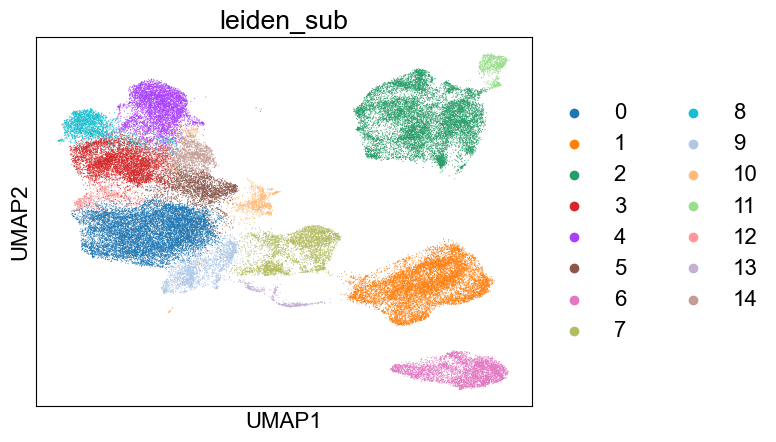

In [5]:

adata = sc.read('../pygot_data/cancer/KPTracer-Data/expression/adata_processed.nt.h5ad')
sigscores = pd.read_csv("../pygot_data/cancer/KPTracer-Data/fitness_signature_scores.tsv", sep='\t', index_col = 0)
kii = np.intersect1d(sigscores.index, adata.obs_names)
adata.obs['FitnessSignature'] = np.nan
adata.obs.loc[kii, 'FitnessSignature'] = sigscores.loc[kii, 'FitnessSignature_NT']
sc.pl.umap(adata, color='leiden_sub')
del adata.raw

  0%|          | 0/11306 [00:00<?, ?it/s]

  0%|          | 0/772 [00:00<?, ?it/s]

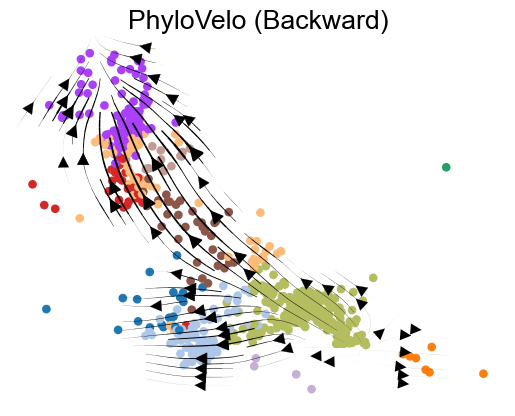

In [6]:
adata_3726_NT_T1, sd_3726_NT_T1 = phylovelo_process(adata, '3726_NT_T1')
fig, ax = plt.subplots(1,1)
sc.pl.umap(adata_3726_NT_T1, color='Cluster-Name', legend_loc=None, ax=ax, show=False, frameon=False, title='PhyloVelo (Backward)')
ax = pv.velocity_plot(sd_3726_NT_T1.Xdr.to_numpy(), sd_3726_NT_T1.velocity_embeded, ax, 'stream', radius=0.8, lw_coef=1500, arrowsize=2)


In [7]:
calc_phylo_pseudotime(sd_3726_NT_T1, n_neighbors=100, r_sample=0.8)
adata_3726_NT_T1.obs['phylo_pseudotime'] = sd_3726_NT_T1.phylo_pseudotime

(CVXPY) Apr 09 05:35:35 PM: Encountered unexpected exception importing solver GLOP:
RuntimeError('Unrecognized new version of ortools (9.11.4210). Expected < 9.10.0. Please open a feature request on cvxpy to enable support for this version.')
(CVXPY) Apr 09 05:35:35 PM: Encountered unexpected exception importing solver PDLP:
RuntimeError('Unrecognized new version of ortools (9.11.4210). Expected < 9.10.0. Please open a feature request on cvxpy to enable support for this version.')


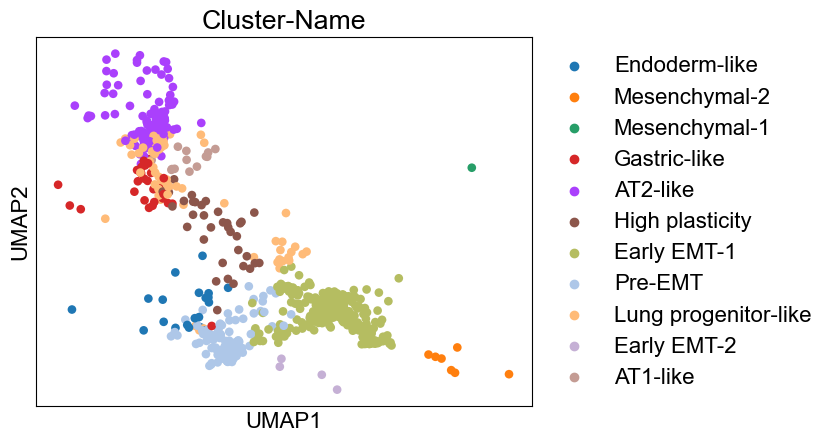

In [8]:
import cassiopeia as cas
from matplotlib.colors import ListedColormap
with open('../pygot_data/cancer/KPTracer-Data/trees/3726_NT_T1_tree.nwk', 'r') as f:
    tree = f.read()

# Initialize tree
tree = cas.data.CassiopeiaTree(tree=tree)
meta_df = adata[pd.Index(tree.leaves).intersection(adata.obs.index)].obs
tree.cell_meta = meta_df
sc.pl.umap(adata[meta_df.index], color='Cluster-Name')
categorical_cmap= ListedColormap(
adata[meta_df.index].uns['Cluster-Name_colors'])


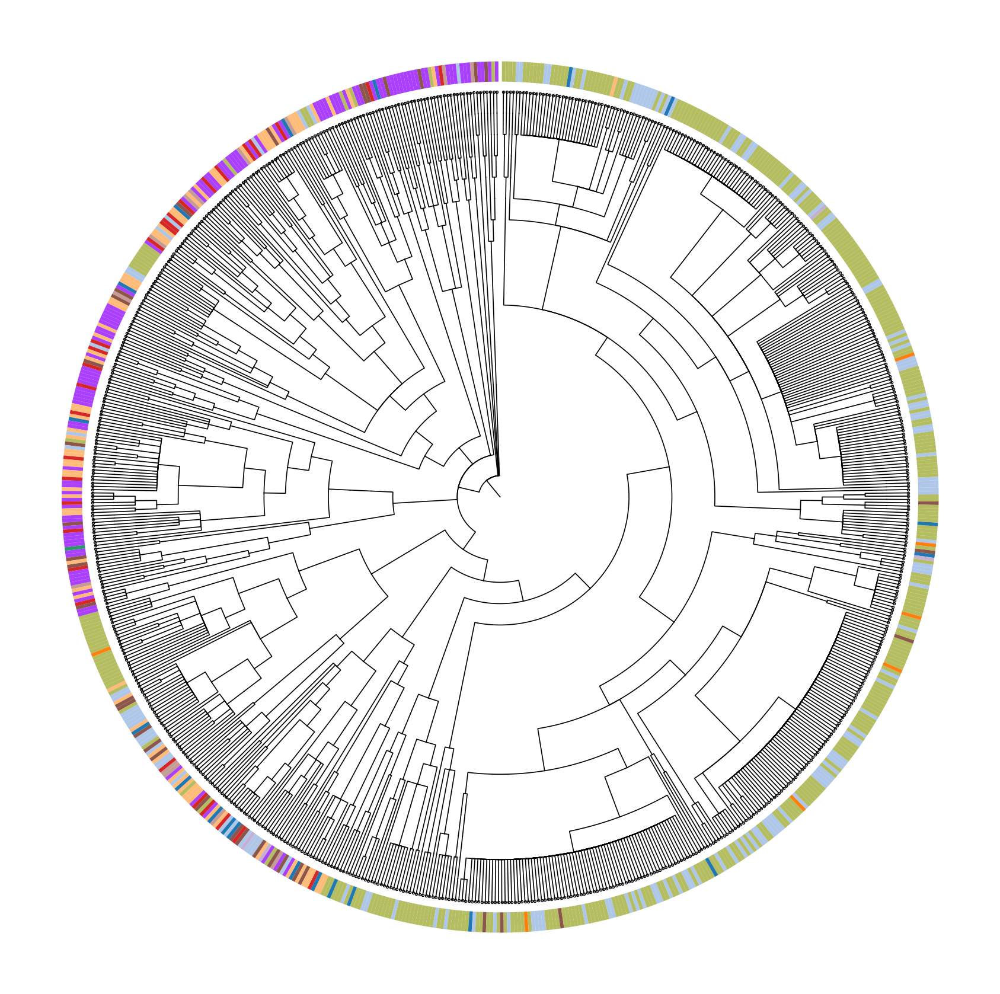

In [9]:
fig, ax = plt.subplots(1,1,figsize=(7,7), dpi=300)

cas.pl.plot_matplotlib(tree, add_root=True, 
                       leaf_kwargs={'s':0.1},
                       branch_kwargs={'linewidth':0.4},
                       ax=ax, meta_data='Cluster-Name', 
                       categorical_cmap= categorical_cmap,
                      value_mapping=dict(zip(meta_df['Cluster-Name'].cat.categories, 
                                             range(len(meta_df['Cluster-Name'].cat.categories)))))



  0%|          | 0/11622 [00:00<?, ?it/s]

  0%|          | 0/1109 [00:00<?, ?it/s]

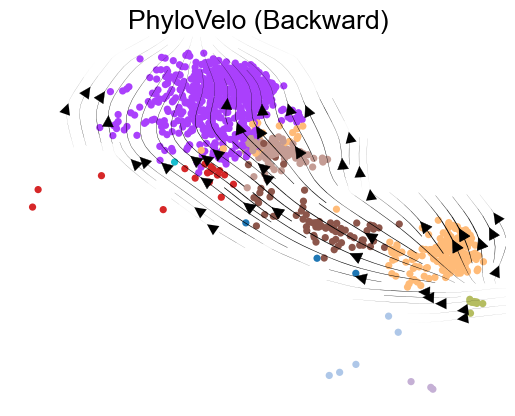

In [10]:
adata_3435_NT_T1, sd_3435_NT_T1 = phylovelo_process(adata, '3435_NT_T1')
fig, ax = plt.subplots(1,1)
sc.pl.umap(adata_3435_NT_T1, color='Cluster-Name', legend_loc=None, ax=ax, show=False, frameon=False, title='PhyloVelo (Backward)')
ax = pv.velocity_plot(sd_3435_NT_T1.Xdr.to_numpy(), sd_3435_NT_T1.velocity_embeded, ax, 'stream', radius=0.8, lw_coef=1500, arrowsize=2)
calc_phylo_pseudotime(sd_3435_NT_T1, n_neighbors=100, r_sample=0.8)
adata_3435_NT_T1.obs['phylo_pseudotime'] = sd_3435_NT_T1.phylo_pseudotime

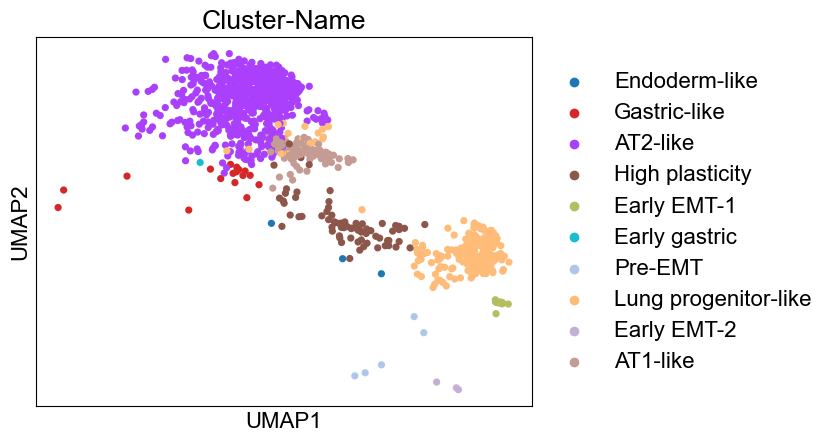

In [11]:
import cassiopeia as cas
from matplotlib.colors import ListedColormap
with open('../pygot_data/cancer/KPTracer-Data/trees/3435_NT_T1_tree.nwk', 'r') as f:
    tree = f.read()

# Initialize tree
tree = cas.data.CassiopeiaTree(tree=tree)
meta_df = adata[pd.Index(tree.leaves).intersection(adata.obs.index)].obs
tree.cell_meta = meta_df
sc.pl.umap(adata[meta_df.index], color='Cluster-Name')
categorical_cmap= ListedColormap(
adata[meta_df.index].uns['Cluster-Name_colors'])


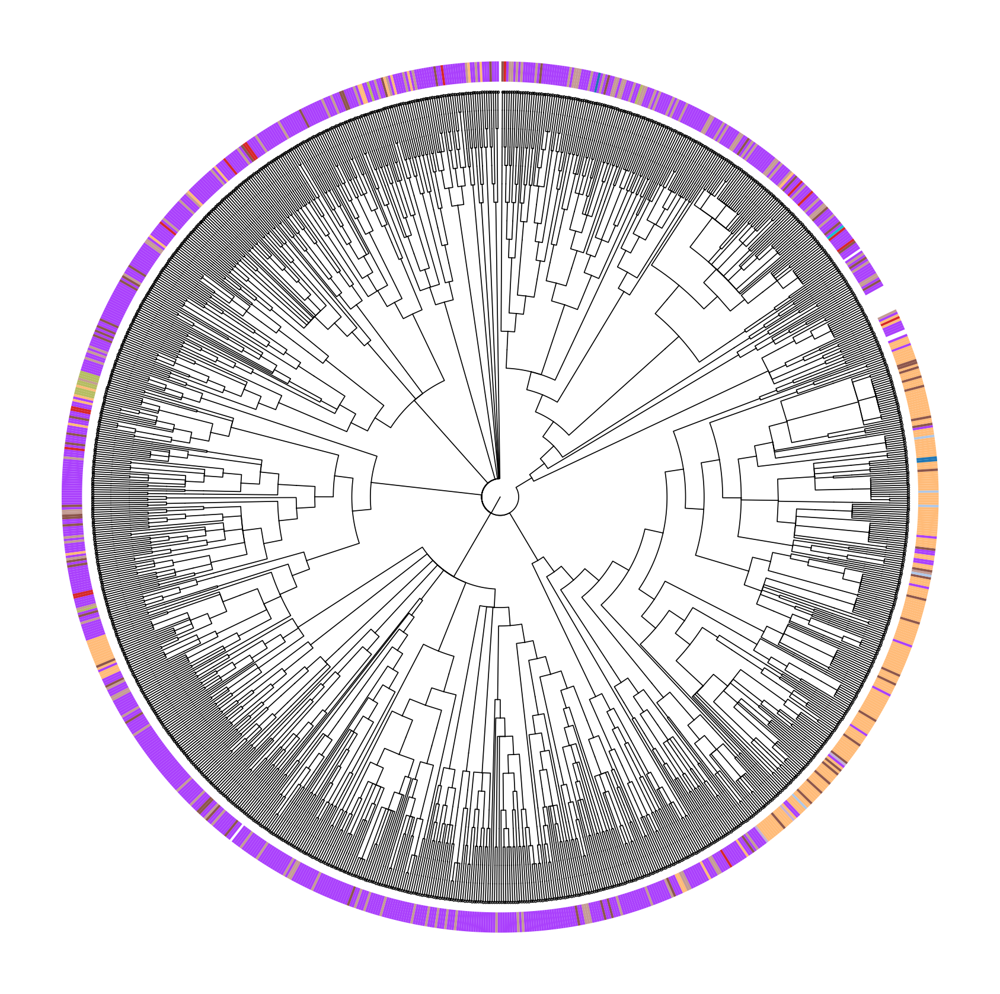

In [12]:
fig, ax = plt.subplots(1,1,figsize=(7,7), dpi=300)

cas.pl.plot_matplotlib(tree, add_root=True, 
                       leaf_kwargs={'s':0.1},
                       branch_kwargs={'linewidth':0.4},
                       ax=ax, meta_data='Cluster-Name', 
                       categorical_cmap= categorical_cmap,
                      value_mapping=dict(zip(meta_df['Cluster-Name'].cat.categories, 
                                             range(len(meta_df['Cluster-Name'].cat.categories)))))


## GOT vector field

In [13]:
from sklearn.preprocessing import minmax_scale

### 3726_NT_T1

In [14]:
adata_3726_NT_T1_orig = adata[adata.obs['Tumor'] == '3726_NT_T1'].copy()

2025-04-09 17:40:47	 Using extrema in diffmap space to connect the whole graph
2025-04-09 17:40:47	 Search for the best source cell..
Convert into connected graph


100%|█████████████████████████████████████████████████████████████████████████████████████████| 821/821 [00:27<00:00, 30.06it/s]


optimal transport root cell write in adata.uns['ot_root']
optimal transport + cytotrace root cell write in adata.uns['ot_ct_root']
2025-04-09 17:41:16	 Determine linear progress or not..
2025-04-09 17:41:16	 Single Branch Progress : False


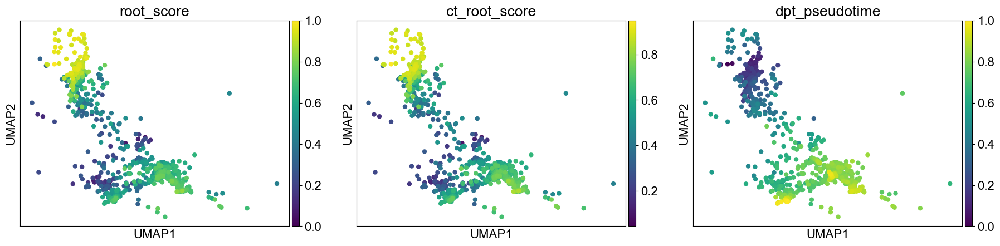

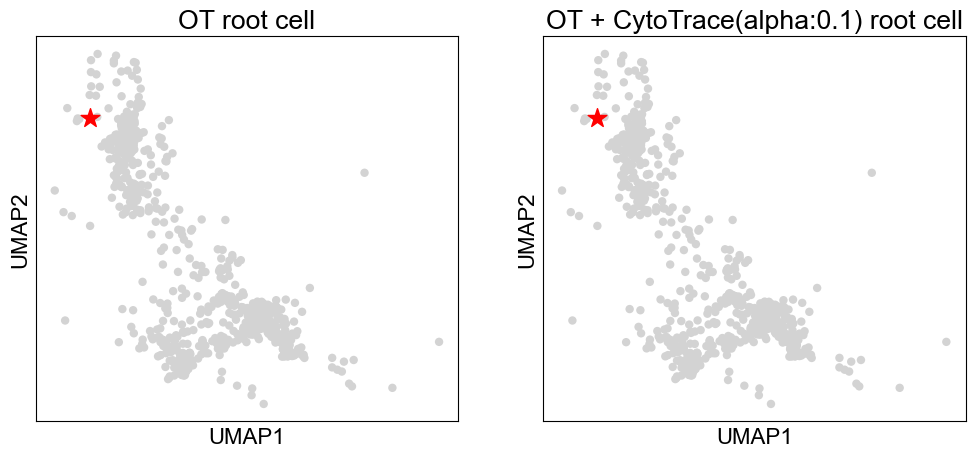

2025-04-09 17:41:16	 Search for the best split k..
fitting k: 3
fitting k: 4
fitting k: 5
fitting k: 6
fitting k: 7
fitting k: 8
fitting k: 9
Best split k is 8


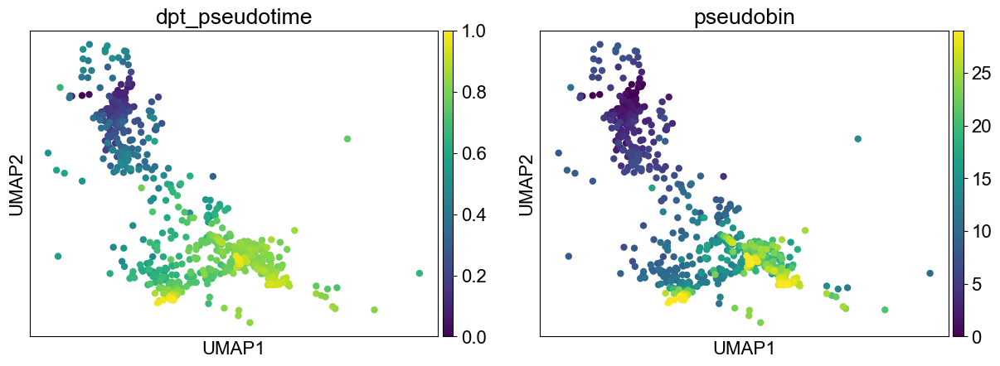

2025-04-09 17:41:16	 Start to fit velocity model
loading saved shortest path profile
[Errno 2] No such file or directory: '/_0.0to1.0.pkl'
Error in loading shortest path file
calcu shortest path between 0.0 to 1.0


100%|████████████████████████████████████████████████████████████████████████████████████████| 28/28 [00:00<00:00, 14781.69it/s]


calcu shortest path between 1.0 to 2.0


100%|████████████████████████████████████████████████████████████████████████████████████████| 28/28 [00:00<00:00, 15311.67it/s]


calcu shortest path between 2.0 to 3.0


100%|████████████████████████████████████████████████████████████████████████████████████████| 28/28 [00:00<00:00, 15179.08it/s]


calcu shortest path between 3.0 to 4.0


100%|████████████████████████████████████████████████████████████████████████████████████████| 28/28 [00:00<00:00, 16163.02it/s]


calcu shortest path between 4.0 to 5.0


100%|████████████████████████████████████████████████████████████████████████████████████████| 28/28 [00:00<00:00, 14685.57it/s]


calcu shortest path between 5.0 to 6.0


100%|████████████████████████████████████████████████████████████████████████████████████████| 28/28 [00:00<00:00, 14207.66it/s]


calcu shortest path between 6.0 to 7.0


100%|████████████████████████████████████████████████████████████████████████████████████████| 28/28 [00:00<00:00, 14199.07it/s]


calcu shortest path between 7.0 to 8.0


100%|████████████████████████████████████████████████████████████████████████████████████████| 28/28 [00:00<00:00, 14379.88it/s]


calcu shortest path between 8.0 to 9.0


100%|████████████████████████████████████████████████████████████████████████████████████████| 28/28 [00:00<00:00, 15806.26it/s]


calcu shortest path between 9.0 to 10.0


100%|████████████████████████████████████████████████████████████████████████████████████████| 28/28 [00:00<00:00, 16024.08it/s]


calcu shortest path between 10.0 to 11.0


100%|████████████████████████████████████████████████████████████████████████████████████████| 28/28 [00:00<00:00, 15479.18it/s]


calcu shortest path between 11.0 to 12.0


100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:00<00:00, 16455.42it/s]


calcu shortest path between 12.0 to 13.0


100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:00<00:00, 16556.46it/s]


calcu shortest path between 13.0 to 14.0


100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:00<00:00, 14340.41it/s]

calcu shortest path between 14.0 to 15.0



100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:00<00:00, 15254.07it/s]


calcu shortest path between 15.0 to 16.0


100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:00<00:00, 15091.45it/s]


calcu shortest path between 16.0 to 17.0


100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:00<00:00, 14642.64it/s]


calcu shortest path between 17.0 to 18.0


100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:00<00:00, 15129.75it/s]


calcu shortest path between 18.0 to 19.0


100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:00<00:00, 15477.14it/s]


calcu shortest path between 19.0 to 20.0


100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:00<00:00, 14477.91it/s]


calcu shortest path between 20.0 to 21.0


100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:00<00:00, 15659.04it/s]


calcu shortest path between 21.0 to 22.0


100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:00<00:00, 14981.64it/s]

calcu shortest path between 22.0 to 23.0



100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:00<00:00, 16602.58it/s]


calcu shortest path between 23.0 to 24.0


100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:00<00:00, 15061.34it/s]

calcu shortest path between 24.0 to 25.0



100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:00<00:00, 15743.95it/s]


calcu shortest path between 25.0 to 26.0


100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:00<00:00, 15091.45it/s]


calcu shortest path between 26.0 to 27.0


100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:00<00:00, 15441.26it/s]


calcu shortest path between 27.0 to 28.0


100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:00<00:00, 15475.02it/s]


calcu shortest path between 28.0 to 29.0


loss :128.3380  best :128.3380: 100%|█████████████████████████████████████████████████████████| 200/200 [00:37<00:00,  5.38it/s]


In [15]:

sc.pp.neighbors(adata_3726_NT_T1_orig, use_rep='X_scVI')
model_3726_NT_T1_orig, _ = pygot.tl.traj.fit_velocity_model_without_time(adata_3726_NT_T1_orig, embedding_key='X_scVI', plot=True, cell_type_key='Cluster-Name')


In [16]:
adata_3726_NT_T1_orig = adata_3726_NT_T1_orig[adata_3726_NT_T1.obs.index]

Use adata.obsp['connectivities'] as neighbors, please confirm it is computed in embedding space
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


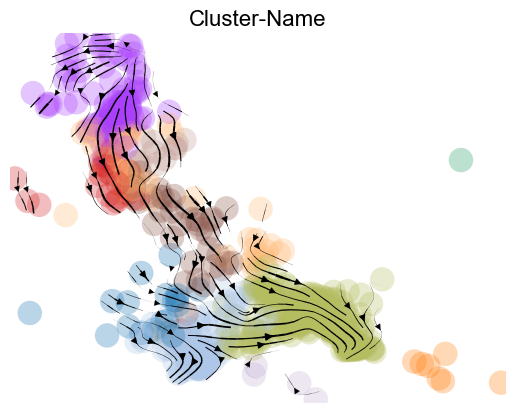

Device: cpu


Density Loss 0.0000, Taylor Loss 1.8450: 100%|████████████████████████████████████████████████| 500/500 [00:48<00:00, 10.37it/s]


In [17]:
adata_3726_NT_T1_orig.obsm['velocity_scVI'] = pygot.tl.traj.latent_velocity(adata_3726_NT_T1_orig, model_3726_NT_T1_orig, embedding_key='X_scVI')
pygot.tl.traj.velocity_graph(adata_3726_NT_T1_orig, embedding_key='X_scVI', velocity_key='velocity_scVI')
#del adata_3726_NT_T1_orig.obsm['velocity_umap']
plot_velocity_embedding_from_latent_velocity(adata_3726_NT_T1_orig, embedding_key='X_scVI', velocity_key='velocity_scVI', color='Cluster-Name', legend_loc='none')
sc.pp.neighbors(adata_3726_NT_T1_orig, use_rep='X_scVI')
pm = pygot.tl.analysis.ProbabilityModel()
pm.fit(adata_3726_NT_T1_orig, embedding_key='X_scVI', velocity_key='velocity_scVI', marginal=False)

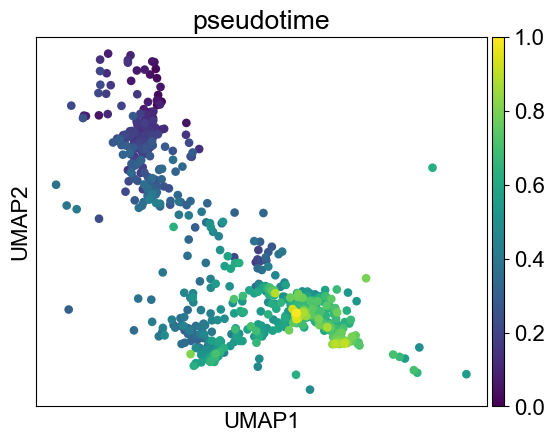

In [18]:
time = pm.estimate_pseudotime(adata_3726_NT_T1_orig).flatten()
upper_bound = np.mean(time) + 3* np.std(time)
lower_bound = np.mean(time) - 3* np.std(time)
time[time > upper_bound] = upper_bound
time[time < lower_bound] = lower_bound
adata_3726_NT_T1_orig.obs['pseudotime'] = minmax_scale(time)
adata_3726_NT_T1_orig.obs['var'] = pm.estimate_variance(adata_3726_NT_T1_orig).flatten()
sc.pl.umap(adata_3726_NT_T1_orig, color=['pseudotime'])

<Axes: xlabel='UMAP1', ylabel='UMAP2'>

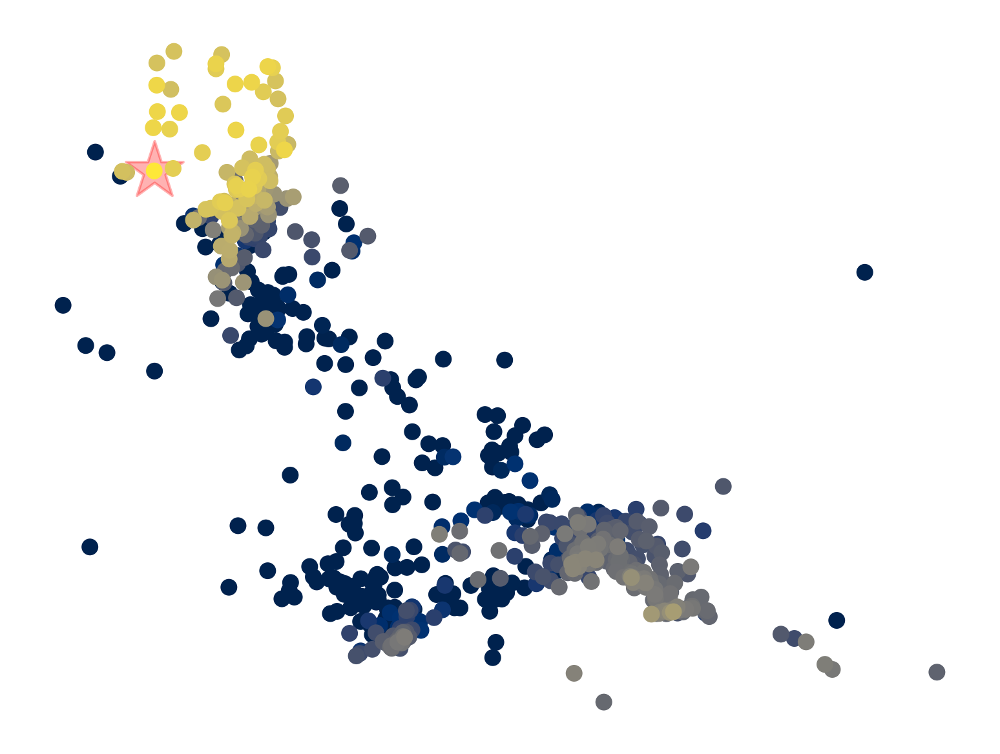

In [19]:
import seaborn as sns
fig, ax = plt.subplots(1,1, figsize=(6.4, 4.8), dpi=300)
root = adata_3726_NT_T1_orig.obs['dpt_pseudotime'].to_numpy().argmin()
ax.scatter(x=adata_3726_NT_T1_orig.obsm['X_umap'][root,0], y=adata_3726_NT_T1.obsm['X_umap'][root,1],  color='red', alpha=.3, marker='*', s=500, label='root cell')
sc.pl.umap(adata_3726_NT_T1_orig, color=['root_score'], cmap='cividis',  legend_loc=None, frameon=False, colorbar_loc=None, title='',vmin=0.5, ax=ax, show=False)

#sc.pl.umap(adata_3726_NT_T1_orig, color=['root_score'], cmap='cividis',  legend_loc=None, frameon=False, colorbar_loc=None, title='',vmin=0.5, ax=ax, show=False)


#plt.close()

<Axes: title={'center': 'PhyloVelo pseudotime'}, xlabel='UMAP1', ylabel='UMAP2'>

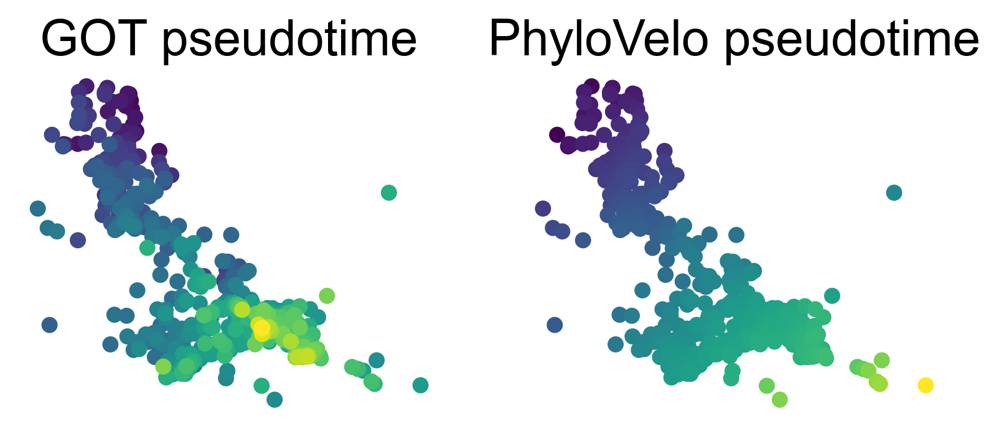

In [20]:
fig, ax = plt.subplots(1,2, dpi=300, figsize=(6.4 , 4.8 / 2))
sc.pl.umap(adata_3726_NT_T1_orig, color='pseudotime', ax=ax[0], show=False, frameon=False, title='GOT pseudotime',  colorbar_loc=None)
sc.pl.umap(adata_3726_NT_T1, color='phylo_pseudotime', ax=ax[1], show=False, frameon=False, title='PhyloVelo pseudotime', colorbar_loc=None)

#plt.close()

<Axes: xlabel='UMAP1', ylabel='UMAP2'>

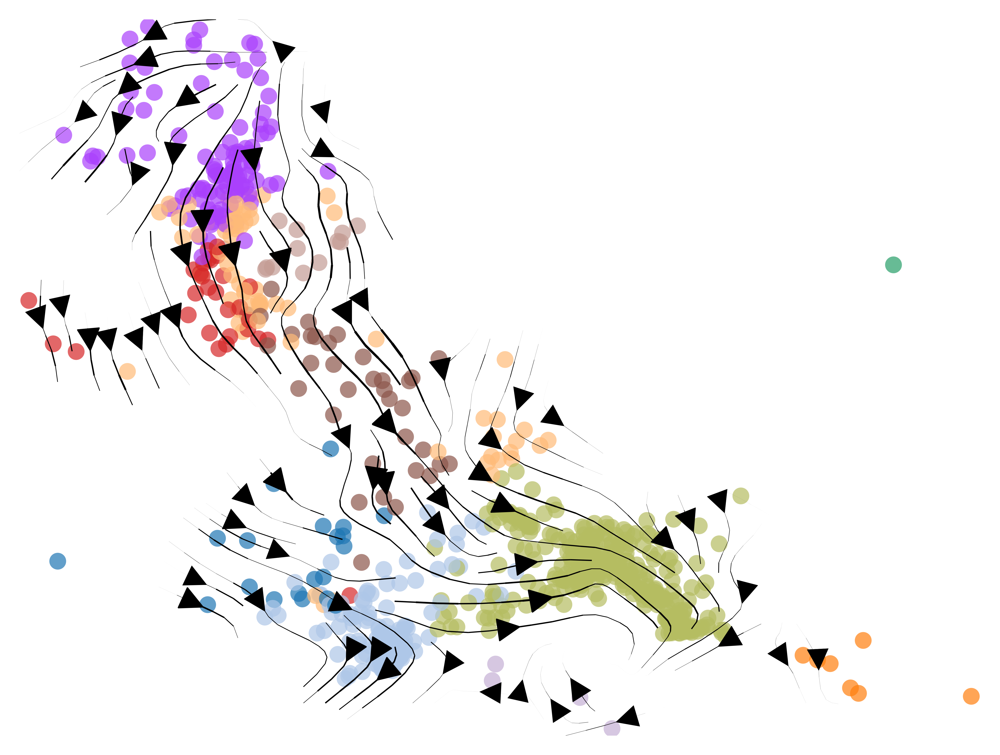

In [21]:
fig, ax = plt.subplots(1,1, dpi=1000)
scv.pl.velocity_embedding_stream(adata_3726_NT_T1_orig, color='Cluster-Name', title='', legend_loc='none', s=1, alpha=0., ax=ax,
                                 linewidth=0.5, arrow_size=2.0, smooth=.75, density=1.5,
                                 show=False)
sc.pl.umap(adata_3726_NT_T1, color='Cluster-Name', ax=ax, title='', frameon=False, legend_loc=None, alpha=0.7, show=False)


#plt.close()

### 3435_NT_T1

2025-04-09 17:43:28	 Using extrema in diffmap space to connect the whole graph
2025-04-09 17:43:28	 Search for the best source cell..
Convert into connected graph


100%|███████████████████████████████████████████████████████████████████████████████████████| 1109/1109 [00:43<00:00, 25.56it/s]


optimal transport root cell write in adata.uns['ot_root']
optimal transport + cytotrace root cell write in adata.uns['ot_ct_root']
2025-04-09 17:44:14	 Determine linear progress or not..


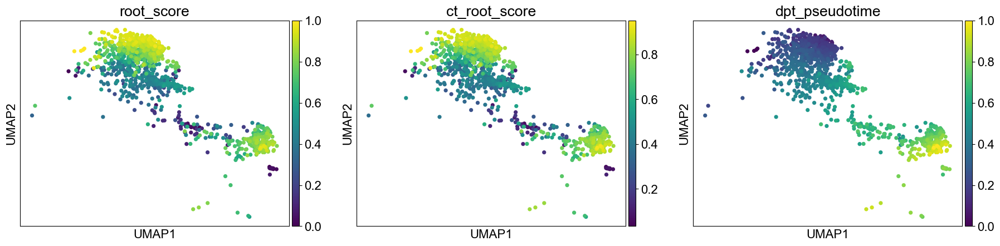

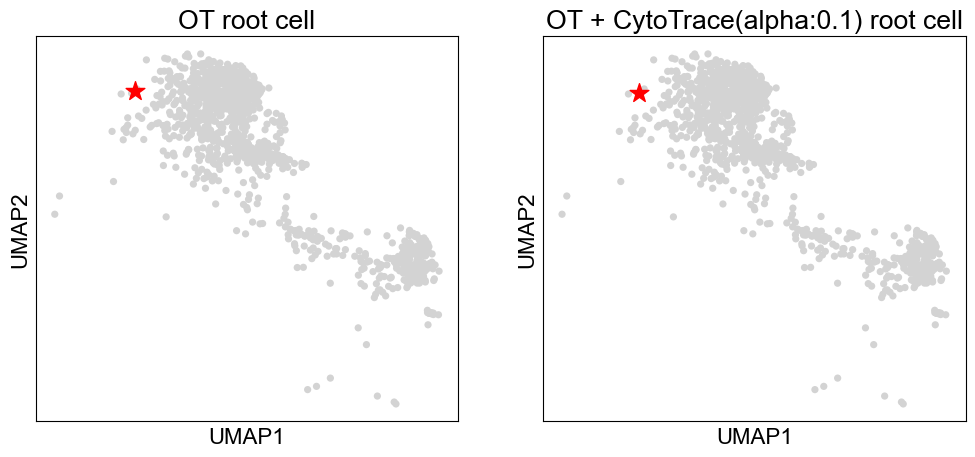

2025-04-09 17:44:14	 Search for the best split k..
fitting k: 3
fitting k: 4
fitting k: 5
fitting k: 6
fitting k: 7
fitting k: 8
fitting k: 9
Best split k is 4


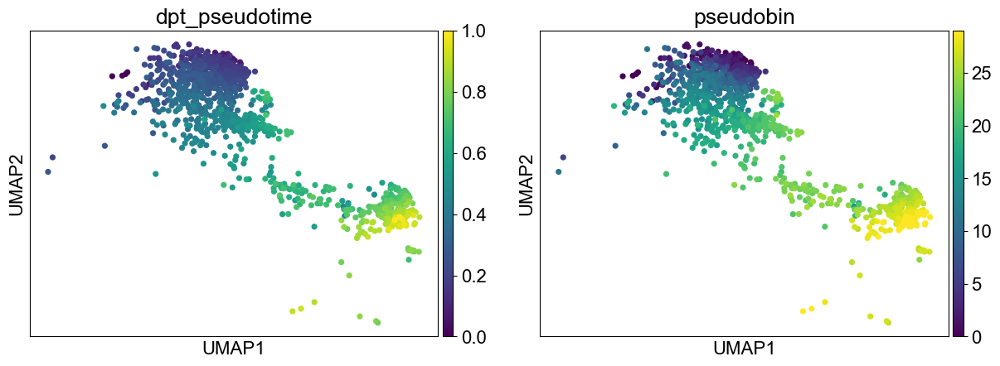

2025-04-09 17:44:14	 Start to fit velocity model
loading saved shortest path profile
[Errno 2] No such file or directory: '/_0.0to1.0.pkl'
Error in loading shortest path file
calcu shortest path between 0.0 to 1.0


100%|████████████████████████████████████████████████████████████████████████████████████████| 37/37 [00:00<00:00, 14390.69it/s]


calcu shortest path between 1.0 to 2.0


100%|████████████████████████████████████████████████████████████████████████████████████████| 37/37 [00:00<00:00, 14592.31it/s]


calcu shortest path between 2.0 to 3.0


100%|████████████████████████████████████████████████████████████████████████████████████████| 37/37 [00:00<00:00, 14630.83it/s]


calcu shortest path between 3.0 to 4.0


100%|████████████████████████████████████████████████████████████████████████████████████████| 37/37 [00:00<00:00, 15801.78it/s]


calcu shortest path between 4.0 to 5.0


100%|████████████████████████████████████████████████████████████████████████████████████████| 37/37 [00:00<00:00, 15480.22it/s]


calcu shortest path between 5.0 to 6.0


100%|████████████████████████████████████████████████████████████████████████████████████████| 37/37 [00:00<00:00, 15584.38it/s]


calcu shortest path between 6.0 to 7.0


100%|████████████████████████████████████████████████████████████████████████████████████████| 37/37 [00:00<00:00, 14109.40it/s]


calcu shortest path between 7.0 to 8.0


100%|████████████████████████████████████████████████████████████████████████████████████████| 37/37 [00:00<00:00, 14683.44it/s]


calcu shortest path between 8.0 to 9.0


100%|████████████████████████████████████████████████████████████████████████████████████████| 37/37 [00:00<00:00, 14086.34it/s]


calcu shortest path between 9.0 to 10.0


100%|████████████████████████████████████████████████████████████████████████████████████████| 37/37 [00:00<00:00, 13907.09it/s]


calcu shortest path between 10.0 to 11.0


100%|████████████████████████████████████████████████████████████████████████████████████████| 37/37 [00:00<00:00, 15672.52it/s]

calcu shortest path between 11.0 to 12.0



100%|████████████████████████████████████████████████████████████████████████████████████████| 37/37 [00:00<00:00, 10864.55it/s]


calcu shortest path between 12.0 to 13.0


100%|████████████████████████████████████████████████████████████████████████████████████████| 37/37 [00:00<00:00, 13538.28it/s]


calcu shortest path between 13.0 to 14.0


100%|████████████████████████████████████████████████████████████████████████████████████████| 37/37 [00:00<00:00, 13816.71it/s]


calcu shortest path between 14.0 to 15.0


100%|████████████████████████████████████████████████████████████████████████████████████████| 37/37 [00:00<00:00, 13981.01it/s]


calcu shortest path between 15.0 to 16.0


100%|████████████████████████████████████████████████████████████████████████████████████████| 37/37 [00:00<00:00, 14086.34it/s]


calcu shortest path between 16.0 to 17.0


100%|████████████████████████████████████████████████████████████████████████████████████████| 37/37 [00:00<00:00, 14176.42it/s]


calcu shortest path between 17.0 to 18.0


100%|████████████████████████████████████████████████████████████████████████████████████████| 37/37 [00:00<00:00, 14120.95it/s]


calcu shortest path between 18.0 to 19.0


100%|████████████████████████████████████████████████████████████████████████████████████████| 37/37 [00:00<00:00, 14870.57it/s]


calcu shortest path between 19.0 to 20.0


100%|████████████████████████████████████████████████████████████████████████████████████████| 37/37 [00:00<00:00, 13361.11it/s]

calcu shortest path between 20.0 to 21.0



100%|████████████████████████████████████████████████████████████████████████████████████████| 37/37 [00:00<00:00, 14390.69it/s]


calcu shortest path between 21.0 to 22.0


100%|████████████████████████████████████████████████████████████████████████████████████████| 37/37 [00:00<00:00, 14592.31it/s]


calcu shortest path between 22.0 to 23.0


100%|████████████████████████████████████████████████████████████████████████████████████████| 37/37 [00:00<00:00, 14210.17it/s]


calcu shortest path between 23.0 to 24.0


100%|████████████████████████████████████████████████████████████████████████████████████████| 37/37 [00:00<00:00, 13889.67it/s]


calcu shortest path between 24.0 to 25.0


100%|████████████████████████████████████████████████████████████████████████████████████████| 37/37 [00:00<00:00, 14389.36it/s]


calcu shortest path between 25.0 to 26.0


100%|████████████████████████████████████████████████████████████████████████████████████████| 37/37 [00:00<00:00, 13969.69it/s]


calcu shortest path between 26.0 to 27.0


100%|████████████████████████████████████████████████████████████████████████████████████████| 37/37 [00:00<00:00, 14126.09it/s]


calcu shortest path between 27.0 to 28.0


100%|████████████████████████████████████████████████████████████████████████████████████████| 37/37 [00:00<00:00, 14104.27it/s]


calcu shortest path between 28.0 to 29.0


loss :57.9609  best :57.9609: 100%|███████████████████████████████████████████████████████████| 200/200 [00:39<00:00,  5.09it/s]


Use adata.obsp['connectivities'] as neighbors, please confirm it is computed in embedding space
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


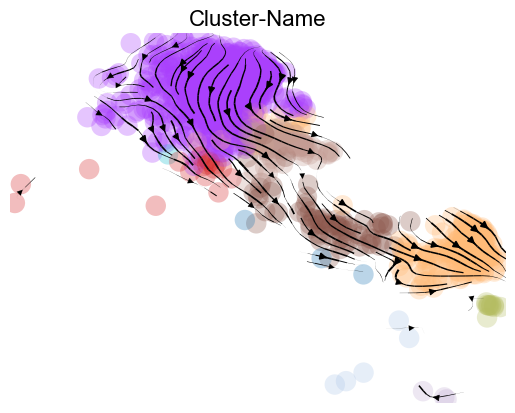

In [22]:
adata_3435_NT_T1_orig = adata[adata_3435_NT_T1.obs.index].copy()
sc.pp.neighbors(adata_3435_NT_T1_orig, use_rep='X_scVI')
model_3435_NT_T1_orig, _ = pygot.tl.traj.fit_velocity_model_without_time(adata_3435_NT_T1_orig, embedding_key='X_scVI', plot=True, single_branch_detect=False)
adata_3435_NT_T1_orig.obsm['velocity_scVI'] = pygot.tl.traj.latent_velocity(adata_3435_NT_T1_orig, model_3435_NT_T1_orig, embedding_key='X_scVI')
pygot.tl.traj.velocity_graph(adata_3435_NT_T1_orig, embedding_key='X_scVI', velocity_key='velocity_scVI')
plot_velocity_embedding_from_latent_velocity(adata_3435_NT_T1_orig, embedding_key='X_scVI', velocity_key='velocity_scVI', color='Cluster-Name', legend_loc='none')


In [23]:
pm = pygot.tl.analysis.ProbabilityModel()
pm.fit(adata_3435_NT_T1_orig, embedding_key='X_scVI', velocity_key='velocity_scVI', marginal=False)


Device: cpu


Density Loss 0.0000, Taylor Loss 1.2616: 100%|████████████████████████████████████████████████| 500/500 [00:51<00:00,  9.68it/s]


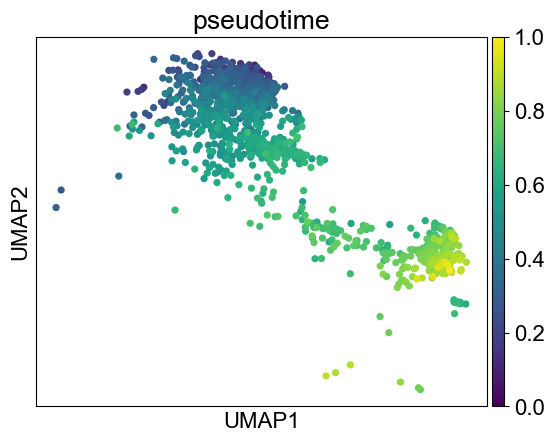

In [24]:
time = pm.estimate_pseudotime(adata_3435_NT_T1_orig).flatten()
upper_bound = np.mean(time) + 3* np.std(time)
lower_bound = np.mean(time) - 3* np.std(time)
time[time > upper_bound] = upper_bound
time[time < lower_bound] = lower_bound
adata_3435_NT_T1_orig.obs['pseudotime'] = minmax_scale(time)
adata_3435_NT_T1_orig.obs['var'] = pm.estimate_variance(adata_3435_NT_T1_orig).flatten()
sc.pl.umap(adata_3435_NT_T1_orig, color=['pseudotime'])


<Axes: xlabel='UMAP1', ylabel='UMAP2'>

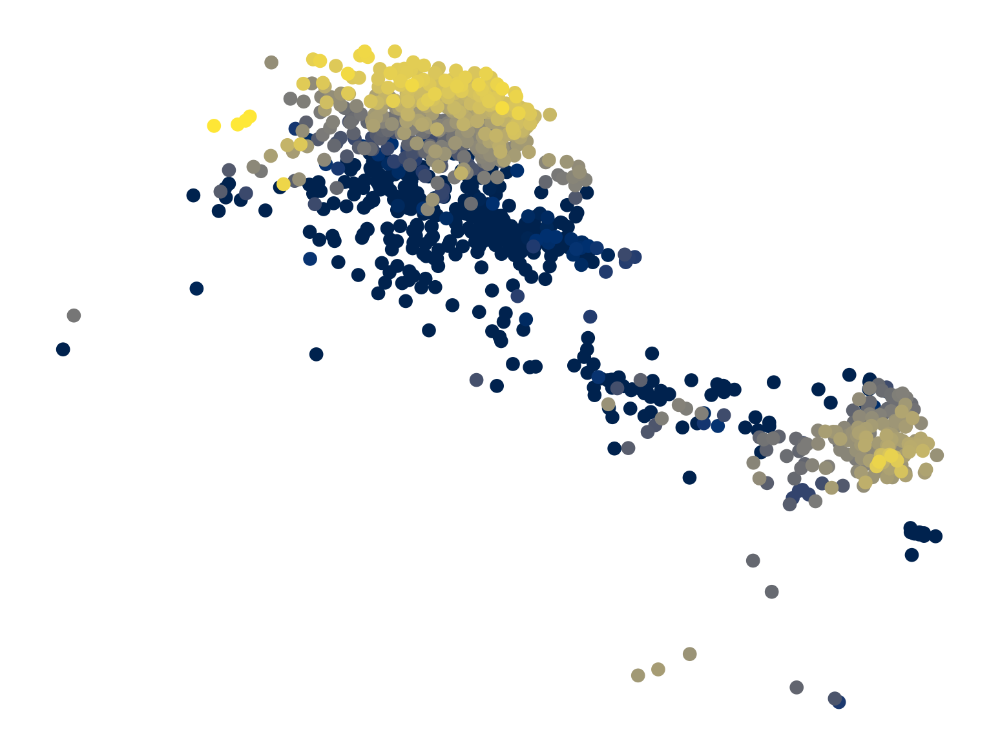

In [54]:
import seaborn as sns
fig, ax = plt.subplots(1,1, figsize=(6.4, 4.8), dpi=300)
root = adata_3435_NT_T1_orig.obs['dpt_pseudotime'].to_numpy().argmin()
#ax.scatter(x=adata_3435_NT_T1_orig.obsm['X_umap'][root,0], y=adata_3435_NT_T1_orig.obsm['X_umap'][root,1],  color='red', alpha=.3, marker='*', s=500, label='root cell')
sc.pl.umap(adata_3435_NT_T1_orig, color=['root_score'], cmap='cividis',  legend_loc=None, frameon=False, colorbar_loc=None, title='',vmin=0.5, ax=ax, show=False)

#sc.pl.umap(adata_3726_NT_T1_orig, color=['root_score'], cmap='cividis',  legend_loc=None, frameon=False, colorbar_loc=None, title='',vmin=0.5, ax=ax, show=False)


#plt.close()

<Axes: xlabel='UMAP1', ylabel='UMAP2'>

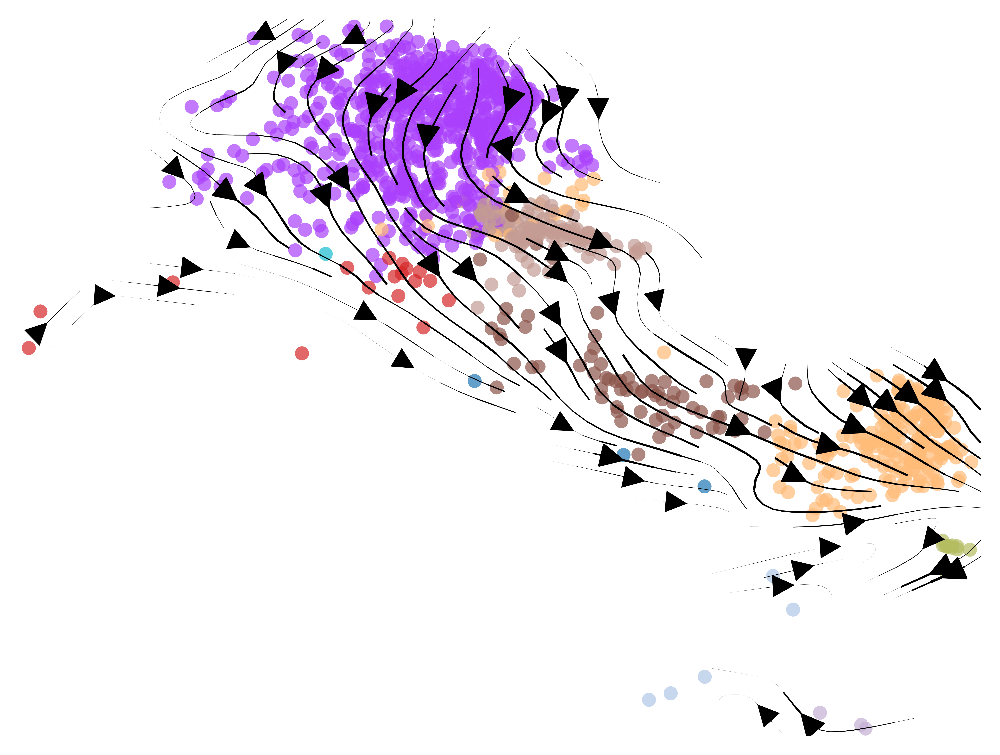

In [26]:
fig, ax = plt.subplots(1,1, dpi=1000)
scv.pl.velocity_embedding_stream(adata_3435_NT_T1_orig, color='Cluster-Name', title='', legend_loc='none', s=1, alpha=0., ax=ax,
                                 linewidth=0.5, arrow_size=2.0, smooth=.75, density=1.5,
                                 show=False)
sc.pl.umap(adata_3435_NT_T1_orig, color='Cluster-Name', ax=ax, title='', frameon=False, legend_loc=None, alpha=0.7, show=False)


#plt.close()

<Axes: title={'center': 'PhyloVelo pseudotime'}, xlabel='UMAP1', ylabel='UMAP2'>

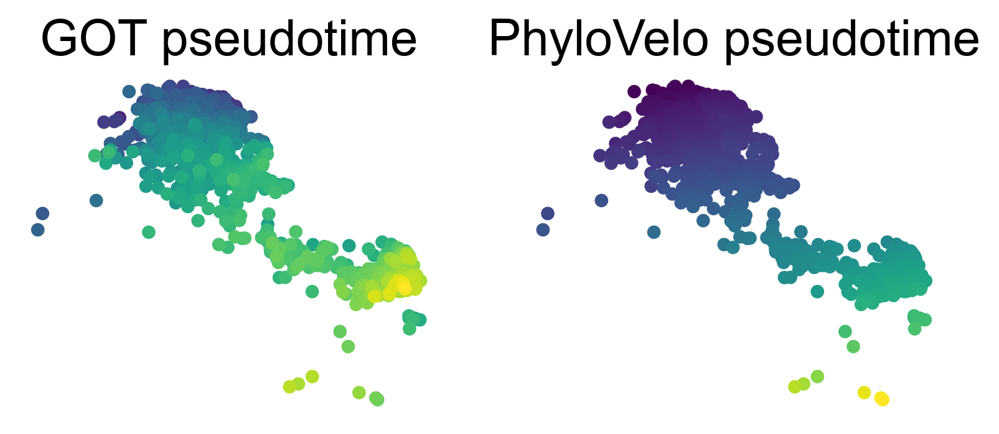

In [27]:
fig, ax = plt.subplots(1,2, dpi=300, figsize=(6.4 , 4.8 / 2))
sc.pl.umap(adata_3435_NT_T1_orig, color='pseudotime', ax=ax[0], show=False, frameon=False, title='GOT pseudotime',  colorbar_loc=None)
sc.pl.umap(adata_3435_NT_T1, color='phylo_pseudotime', ax=ax[1], show=False, frameon=False, title='PhyloVelo pseudotime', colorbar_loc=None)

#plt.close()

### Pseudotime Correlation

In [28]:
from scipy.stats import spearmanr
import colorcet as cc
import seaborn as sns
def compute_pseudotime_corr(adata, ax=None):
    x = adata.obs['pseudotime']
    y = adata.obs['phylo_pseudotime']
    
    a, b = np.polyfit(x, y, deg=1)
    y_est = a * np.linspace(0,1.0,60) + b
    if ax is None:
        fig, ax = plt.subplots(dpi=300)
    sns.regplot(x=x, y=y, ax=ax, scatter_kws={'s':70, 'alpha':0.7}, color='grey')
    #ax.scatter(x, y, alpha=0.4, s=70)
    #ax.hist2d(x, y, bins=[100,100], cmap=cc.cm.CET_L19)
    #ax.plot(np.linspace(0,1,60), y_est, '-', c='k')
    ax.set_xlabel('GOT pseudotime', fontsize=17)
    ax.set_ylabel('PhyloVelo pseudotime', fontsize=17)
    # ax.text(50, 0.9, 'spearmanr={:.2g}\np_val={:.2g}'.format(*spearmanr(x, y)), fontsize=15)
    rho, pval = spearmanr(x, y)
    ax.text(0, 0.98, r"Spearman's $\rho$={:.2g}".format(rho), fontsize=15)
    ax.text(0, 0.85, r'$p={}\times 10^{}$'.format(*r'{:.2e}'.format(pval).split('e')).replace('^', '^{').replace('$', '}$')[1:], fontsize=15)
    #ax.set_ylim(0, 1.05)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

In [29]:
adata_3726_NT_T1.obs['pseudotime'] = adata_3726_NT_T1_orig.obs.loc[adata_3726_NT_T1.obs.index]['pseudotime']
adata_3435_NT_T1.obs['pseudotime'] = adata_3435_NT_T1_orig.obs.loc[adata_3435_NT_T1.obs.index]['pseudotime']

meta NOT subset; don't know how to subset; dropped


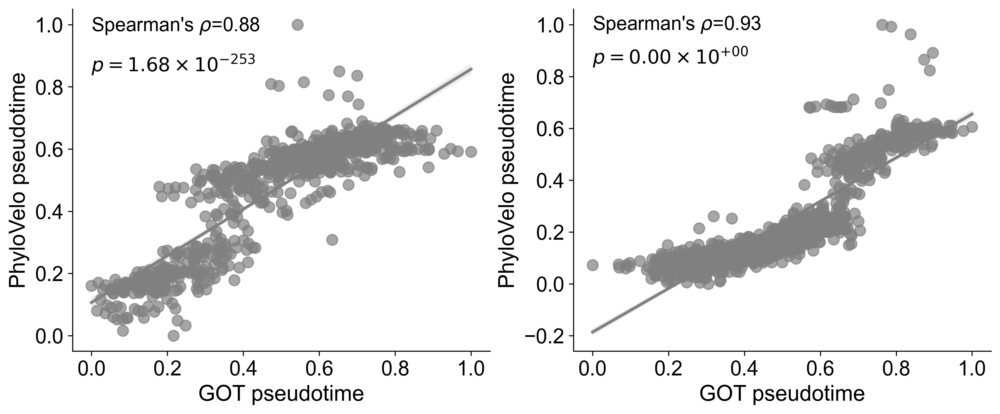

In [55]:
fig, axes = plt.subplots(1,2,dpi=300, figsize=(6.4*2, 4.8))

compute_pseudotime_corr(adata_3435_NT_T1, axes[1])
compute_pseudotime_corr(adata_3726_NT_T1, axes[0])



## Dynamical gene and TCGA analysis

In [31]:

pygot.tl.analysis.dcor_test(adata_3726_NT_T1_orig, 'pseudotime')

100%|████████████████████████████████████████████████████████████████████████████████████| 27998/27998 [02:42<00:00, 172.11it/s]


In [32]:
dynamical_genes = adata_3726_NT_T1_orig.var['statistic'].sort_values(ascending=False)[:100].index

In [33]:
dynamical_genes

Index(['Cd74', 'Vim', 'Spp1', 'Sftpb', 'Igfbp4', 'Lgals1', 'Ly6d', 'Ctsh',
       'Egfl6', 'H2-Ab1', 'Fbln2', 'Sftpd', 'S100a6', 'H2-Aa', 'Npc2', 'Napsa',
       'H2-Eb1', 'Selenbp1', 'Stmn2', 'Cdkn2a', 'Atp1b1', 'Fscn1', 'H2-K1',
       'Cxcl15', 'Chil1', 'Hp', 'Lcn2', 'Tmsb10', 'Dram1', 'Tuba1a', 'Gm9844',
       'Timp1', 'H2-D1', 'Cldn7', 'Epcam', 'Tgoln1', 'Lyz2', 'Prnp', 'Rtn4',
       'Cldn3', 'Igfbp7', 'Lrg1', 'Slc34a2', 'Scd1', 'Hmga2', 'Msn', 'Map1b',
       'Mgst1', 'Sftpc', 'Fn1', 'Wfdc2', 'Tc2n', 'Bgn', 'Vamp8', 'Uchl1',
       'Hmga1-rs1', 'Muc1', 'Inhba', 'Ppia', 'Onecut2', 'Pkm', 'Chchd10',
       'Cd36', 'Ly6c1', 'Areg', 'Spint2', 'F2r', 'Capg', 'Npm1', 'Nkx2-1',
       'Cxcl17', 'Ranbp1', 'Phgdh', 'Ran', 'H2-Q7', 'Pdlim7', 'S100a10',
       'Rnaset2a', 'Cnn3', 'Me1', 'Bmp4', 'Pglyrp1', 'Msln', 'Cpe', 'Tspan1',
       'Ier3', 'Ffar4', 'Ugdh', 'AU021092', 'Set', 'Sat1', 'Anxa2', 'Slc25a4',
       'Serbp1', 'Eno1', 'Nme2', 'Rbp1', 'Emp1', 'Eif5a', 'Elovl1'],
      dtype='

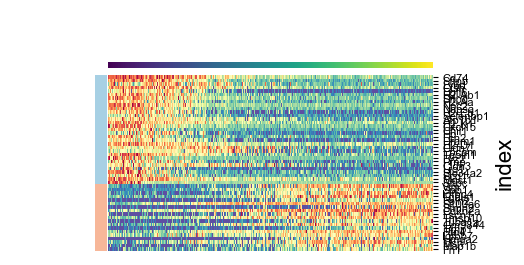

In [34]:
fig, cluster_genes = pygot.pl.plot_dynamical_genes_clusetermap(adata_3726_NT_T1_orig[:,dynamical_genes[:50]], n_clusters=2, figsize=(6,3))

In [35]:
highlight_genes = np.concatenate([adata_3726_NT_T1_orig.var.loc[cluster_genes.loc[cluster_genes.cluster == i].gene].sort_values('statistic', ascending=False).index[:10] for i in range(2) ])

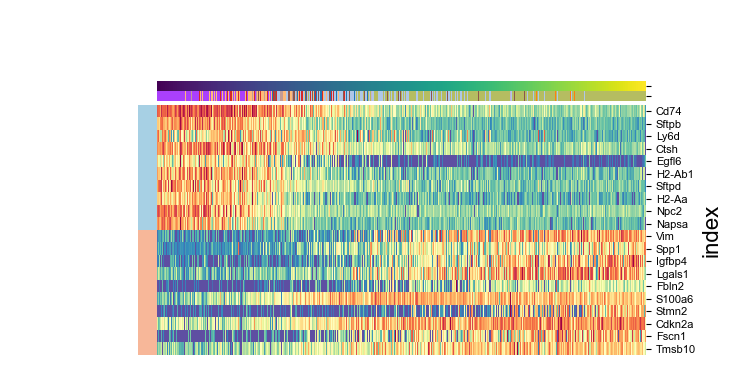

In [36]:
fig, cluster_genes = pygot.pl.plot_dynamical_genes_clusetermap(adata_3726_NT_T1_orig[:,highlight_genes],color='Cluster-Name', n_clusters=2, figsize=(8,4))



In [37]:
# Use map_symbol.R to get this
h2m_mapping = pd.read_csv('/disk/xuruihong/GenomeDir/Human2MouseSymbol.txt', sep='\t')
h2m_mapping

,DB.Class.Key,Symbol.x,Symbol.y
1,47998254,Banf1,BANF1
2,47998255,Bin1,BIN1
3,47998256,Pde9a,PDE9A
4,47998257,Asrgl1,ASRGL1
5,47998258,Clpb,CLPB
...,...,...,...
24585,48018942,Zswim1,ZSWIM1
24586,48018943,Zswim3,ZSWIM3
24587,48018944,Zswim4,ZSWIM4
24588,48018945,Zswim9,ZSWIM9


In [38]:

down_genes = h2m_mapping.set_index('Symbol.x', drop=False).loc[h2m_mapping.set_index('Symbol.x').index.intersection(cluster_genes.loc[cluster_genes.cluster==0].gene)]['Symbol.y'].tolist()
up_genes = h2m_mapping.set_index('Symbol.x', drop=False).loc[h2m_mapping.set_index('Symbol.x').index.intersection(cluster_genes.loc[cluster_genes.cluster==1].gene)]['Symbol.y'].tolist()


In [39]:
immune_genes = cluster_genes.loc[cluster_genes.cluster==0].gene
progress_genes = cluster_genes.loc[cluster_genes.cluster==1].gene
sc.tl.score_genes(adata, immune_genes, score_name='immune')
sc.tl.score_genes(adata, progress_genes, score_name='progress')

<Axes: xlabel='$- \\log_{10}$ (Adjusted P-value)'>

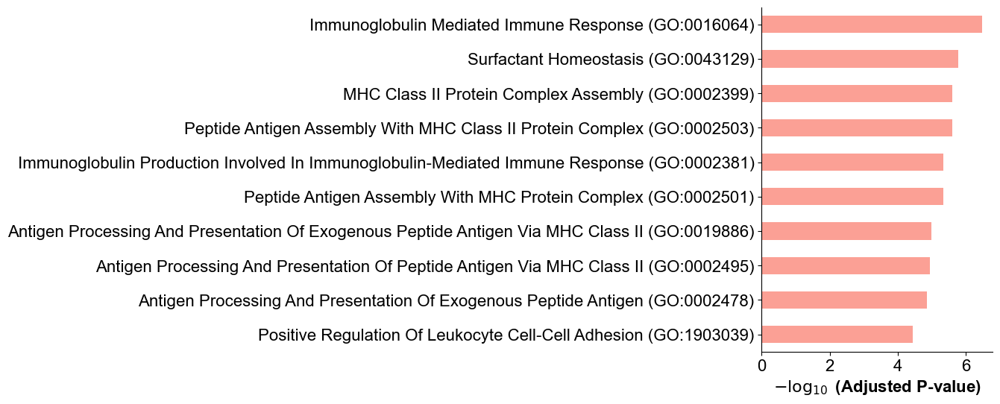

In [40]:
import gseapy as gp
enr = gp.enrichr(down_genes,
           gene_sets='GO_Biological_Process_2023',
            organism='human'
            )
gp.barplot(enr.results)

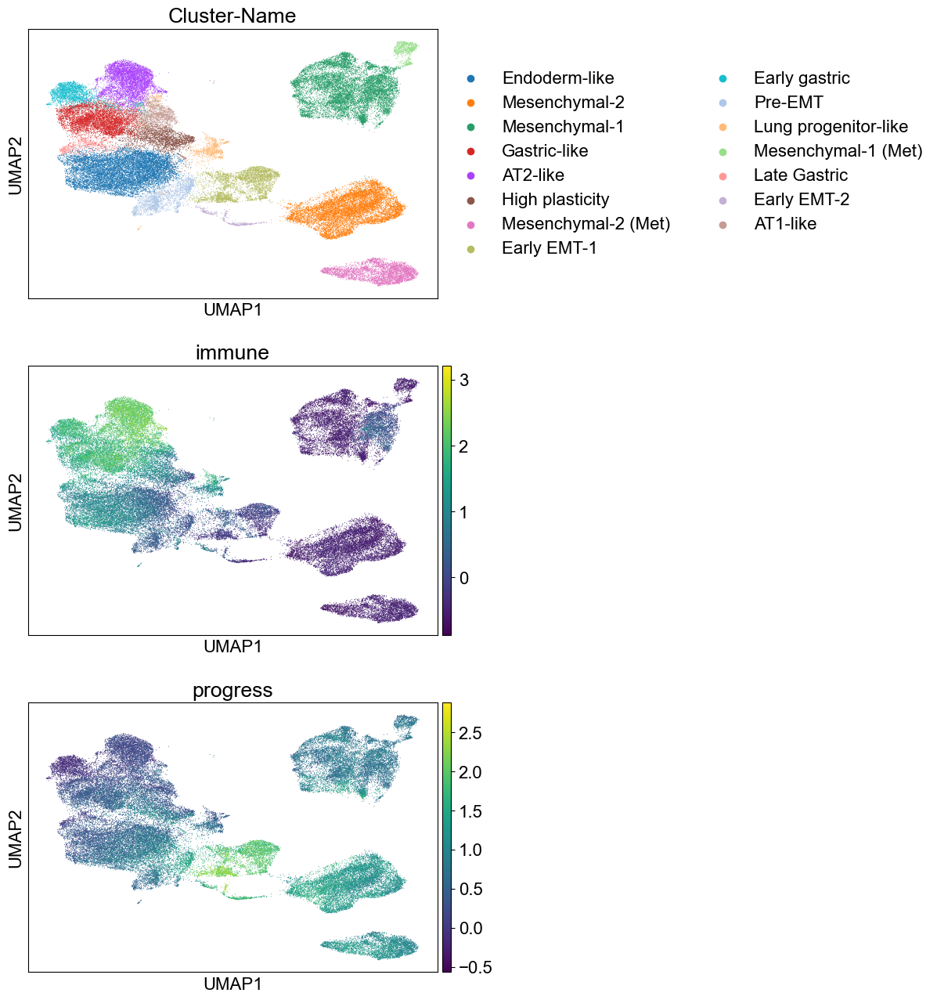

In [41]:
sc.pl.umap(adata, color=['Cluster-Name','immune', 'progress'], ncols=1)

In [42]:
lucd = pd.read_csv('../pygot_data/cancer/luad_tcga_gdc/data_mrna_seq_fpkm.txt', sep='\t')
# TIDE result
tide = pd.read_csv('../pygot_data/cancer/TIDE_score.csv', index_col=0)
tide

,No benefits,Responder,TIDE,IFNG,MSI Expr Sig,Merck18,CD274,CD8,CTL.flag,Dysfunction,Exclusion,MDSC,CAF,TAM M2
Patient,,,,,,,,,,,,,,
TCGA-86-8671-01A,False,False,5.60,1.56,0.29,1.68,0.67,1.76,True,5.60,-2.10,-0.17,0.01,-0.04
TCGA-78-8648-01A,False,False,3.80,0.30,0.21,1.03,0.15,1.58,True,3.80,0.29,-0.13,0.23,-0.06
TCGA-93-7347-01A,False,False,3.63,0.55,0.59,0.90,-0.22,1.50,True,3.63,-0.92,-0.12,0.04,-0.01
TCGA-MP-A4TI-01A,False,False,3.63,1.51,0.45,1.46,2.14,1.00,True,3.63,-0.57,-0.03,0.05,-0.08
TCGA-99-AA5R-01A,False,False,3.57,0.31,0.48,0.72,0.78,1.17,True,3.57,-1.48,-0.12,-0.00,-0.02
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TCGA-64-1677-01A,False,True,-3.19,0.80,0.97,0.24,0.43,0.26,True,-3.19,1.30,0.15,-0.08,0.02
TCGA-55-7728-01A,False,True,-3.29,-0.12,0.40,0.30,0.26,0.00,False,3.69,-3.29,-0.17,-0.12,-0.04
TCGA-44-3917-01A,False,True,-3.42,0.44,0.97,-0.32,-0.41,0.50,True,-3.42,0.43,0.04,-0.05,0.04


In [43]:
#signature 1
print(down_genes)
#signature 2
print(up_genes)
#use gepia2 to do survival analysis

['SFTPD', 'CD74', 'HLA-DQB2', 'HLA-DQB1', 'CTSH', 'HLA-DQA1', 'HLA-DQA2', 'EGFL6', 'SFTPB', 'NAPSA', 'LY6D', 'NPC2']
['VIM', 'LGALS1', 'S100A6', 'FSCN1', 'STMN2', 'TMSB10', 'FBLN2', 'CDKN2A', 'IGFBP4', 'SPP1']


In [44]:
import mygene
mg = mygene.MyGeneInfo()

In [46]:
res = mg.getgenes(lucd['Entrez_Gene_Id'])

In [47]:
symbols = []
for item in res:
    if 'symbol' in item.keys():
        symbols.append(item['symbol'])
    else:
        symbols.append('nan')

In [48]:
adata_lucd = sc.AnnData(lucd[lucd.columns[1:]].T, var = pd.DataFrame(symbols, columns=['gene']))
adata_lucd.obs[tide.columns] = tide.loc[adata_lucd.obs.index]
adata_lucd.var = adata_lucd.var.set_index('gene')
adata_lucd = adata_lucd[:,~adata_lucd.var.index.str.startswith('nan')]
adata_lucd.var_names_make_unique()
sc.pp.log1p(adata_lucd)

In [49]:
norm_z = adata_lucd.X.mean(axis=1)

In [50]:

adata_lucd.obs['immune'] = adata_lucd[:,adata_lucd.var.index.intersection(down_genes)].X.mean(axis=1) / norm_z
adata_lucd.obs['progress'] = adata_lucd[:,adata_lucd.var.index.intersection(up_genes)].X.mean(axis=1) / norm_z


In [51]:
adata_lucd.obs['immune'] 

TCGA-05-4244-01A    5.762580
TCGA-05-4249-01A    6.042669
TCGA-05-4250-01A    5.187216
TCGA-05-4382-01A    4.460430
TCGA-05-4384-01A    5.737878
                      ...   
TCGA-NJ-A55O-01A    5.210826
TCGA-NJ-A55R-01A    4.436336
TCGA-NJ-A7XG-01A    5.516655
TCGA-O1-A52J-01A    6.948491
TCGA-S2-AA1A-01A    4.765759
Name: immune, Length: 518, dtype: float64

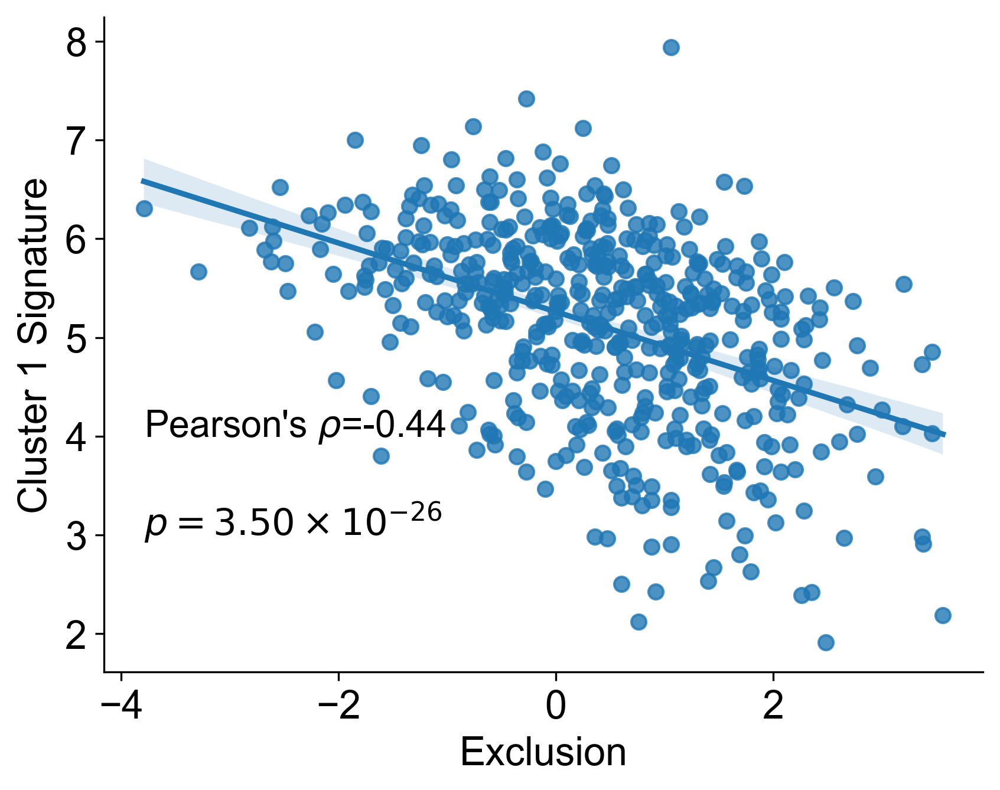

In [52]:
fig, ax = plt.subplots(1,1, dpi=300)
sns.regplot(x=adata_lucd.obs['Exclusion'], y=adata_lucd.obs['immune'])
rho, pval = pearsonr(adata_lucd.obs['Exclusion'], adata_lucd.obs['immune'])
plt.xlabel('Exclusion')
plt.ylabel('Cluster 1 Signature')
ax.text(np.min(adata_lucd.obs['Exclusion']), 4, r"Pearson's $\rho$={:.2g}".format(rho), fontsize=15)
ax.text(np.min(adata_lucd.obs['Exclusion']), 3, r'$p={}\times 10^{}$'.format(*r'{:.2e}'.format(pval).split('e')).replace('^', '^{').replace('$', '}$')[1:], fontsize=15)
#ax.set_ylim(0, 1.05)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)


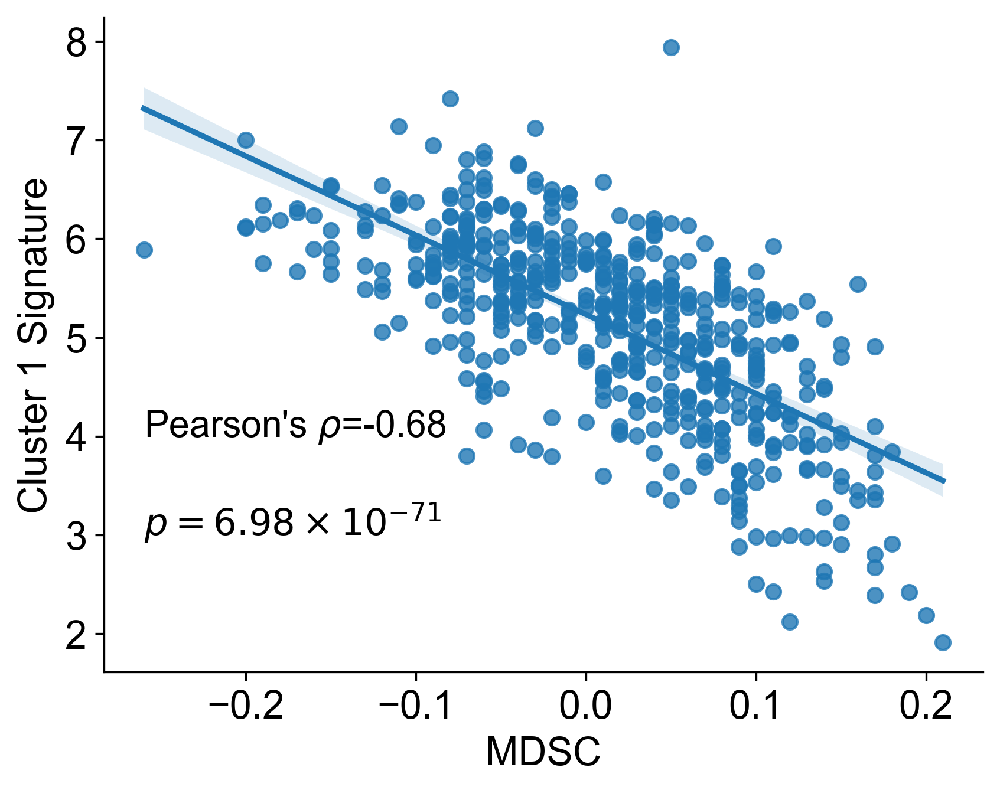

In [53]:

fig, ax = plt.subplots(1,1, dpi=300)
sns.regplot(x=adata_lucd.obs['MDSC'], y=adata_lucd.obs['immune'])
rho, pval = pearsonr(adata_lucd.obs['MDSC'], adata_lucd.obs['immune'])
plt.xlabel('MDSC')
plt.ylabel('Cluster 1 Signature')
ax.text(np.min(adata_lucd.obs['MDSC']), 4, r"Pearson's $\rho$={:.2g}".format(rho), fontsize=15)
ax.text(np.min(adata_lucd.obs['MDSC']), 3, r'$p={}\times 10^{}$'.format(*r'{:.2e}'.format(pval).split('e')).replace('^', '^{').replace('$', '}$')[1:], fontsize=15)
#ax.set_ylim(0, 1.05)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
